In [1]:
import os
import pandas as pd
from text2topics import models

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
data_dir = "/Users/jeriwieringa/Dissertation/data/"

In [4]:
model = models.MalletModel(os.path.join(data_dir, 
                                                     'model_outputs', 
                                                     'target_300_10.18497.state.gz'
                                                    ))

In [5]:
df = model.model()

In [6]:
params = model.extract_params()

In [7]:
# Load metadata

metadata = pd.read_csv(os.path.join(data_dir, "corpus_metadata", "meta.csv"), header=None)\
            .reset_index()
metadata.columns = ['doc_id', 'filename', 'citation', 'author', 
                    'periodical_name', 'volume', 'issue', 
                    'date', 'page', 'url','abrev']
metadata['date_formatted'] = pd.to_datetime(metadata['date'])

In [8]:
# Load Labels

import gspread
from oauth2client.service_account import ServiceAccountCredentials

# Load data from Google Doc
scope = ['https://spreadsheets.google.com/feeds']
secrets = "/Users/jeriwieringa/Dissertation/dev/code/secrets/dissertation-881847769b13.json"
credentials = ServiceAccountCredentials.from_json_keyfile_name(secrets, scope)
gc = gspread.authorize(credentials)
dts = gc.open('Topic Labels').sheet1

labels = pd.DataFrame(dts.get_all_records())

ImportError: No module named 'oauth2client'

In [ ]:
doc_topic = df.groupby(['#doc', 'topic'])['type'].count().reset_index(name="token_count")

In [ ]:
dt = doc_topic.merge(metadata, how='left', left_on="#doc", right_on="doc_id")

In [ ]:
y_dt = dt.groupby([dt.date_formatted.dt.year, "topic"])['token_count']\
        .sum()\
        .reset_index(name='token_count')

In [ ]:
y_m = prepare_mallet_data.pivot_smooth_norm(y_dt, params[0],
                                            'date_formatted', 'topic', 'token_count')

In [ ]:
y_m[:2]

In [ ]:
y_topics = y_m.unstack().reset_index(name='t_proportion')

Add metadata back and aggregate by labels

In [ ]:
category_df = y_topics.merge(labels, how="left", left_on="topic", right_on="mallet_topic_id")\
[['topic', 'date_formatted', 't_proportion', 'topic_category', 'topic_label']]\
.groupby(['date_formatted', 'topic_category'])['t_proportion']\
.sum().reset_index(name='category_prevalence')

In [ ]:
category_df[:35]

Chart gives us an overview of the make up of the periodical literature in a given year. These numbers seem reasonable given my reading of these periodical documents.

## Browse Top Topics by Year

Interface for viewing the top 25 topics in each year. Select starting and ending year (both included in the displayed data.) Also includes an interactive chart of the top weights over time.

In [17]:
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import cufflinks as cf

# Keep charts from syncing with Plotly servers.
init_notebook_mode(connected=True)
cf.go_offline()

In [18]:
years = category_df['date_formatted'].unique().tolist()

def get_top_values(df, n_top):
    return df.groupby('date_formatted').apply(lambda x: x.nlargest(n_top, 'category_prevalence'))\
    .reset_index(drop=True)
    
frame = get_top_values(category_df, 5)

In [19]:
frame[:5]

,date_formatted,topic_category,category_prevalence
0,1849,theology_sabbath,0.250820
1,1849,bible,0.145878
2,1849,eschatology,0.129428
3,1849,theology,0.123143
4,1849,correspondence,0.050922


In [20]:
colors = ["#557ee1",
        "#bca63a",
        "#9776d6",
        "#73a343",
        "#534894",
        "#54b06c",
        "#ba556d",
        "#64b694",
        "#b65147",
        "#5bbcca",
        "#a69357",
        "#7d9bd4",
        "#776e49",
        "#6f759b",
        "#648576",
        "#9a7b75",
         "#6e7c8c"]
topic_colors = dict(zip(frame['topic_category'].unique().tolist(), colors))
# print(topic_colors)

In [21]:
# Function for generating chart data for different time periods
out_dir = "/Users/jeriwieringa/Dissertation/site/files/interact/"

def top_topics(start_year='', 
               end_year='', 
               df=frame, 
               width=900, height=800, 
               colors_dict = topic_colors,
               save=False
              ):
    
    sizeref = 2. * max(df['category_prevalence']*100) / (110 ** 2)
    
    topics = df[(df['date_formatted'] >= start_year) & (df['date_formatted'] <= end_year)]

    layout1 = go.Layout(
        height=height,
        width=width,
        title="Prevalence in Corpus of Top Five Categories per Year,<br>\
                {} to {}".format(start_year, end_year),
        yaxis=go.layout.YAxis(
            title='Topic Categories',
            automargin=True,
        ),
    )

    # Logic of this chart: I have a bubble chart for each set of years that is a compilation of 5+ charts
    # For each sub-chart, I am graphing the value of the topic category in each year, so my x series is years
    # and my y series is topic prevalence. Y value could be 0 in a year, and so should not be graphed.
    # To loop, I want to create a scatter chart for each unique Y (topic_category) value, 
    # with the color determined by the value of Y and the size determined by the category_prevalence.
    
    traces = []

    for cat in topics['topic_category'].unique().tolist():
        cat_df = topics[topics['topic_category'] == cat]
        
        hover_text = []
        for index, row in cat_df.iterrows():
            hover_text.append(("Year: {}<br>\
                                Prevalence: {}%".format(row['date_formatted'],
                                                        row['category_prevalence']*100
                                                       )
                              ))
        
        graph_data = go.Scatter(
            x = cat_df['date_formatted'],
            y = cat_df['topic_category'],
            text = hover_text,
            mode='markers',
            marker=dict(
                symbol='circle',
                size=cat_df['category_prevalence']*100,
                sizemode='area',
                sizeref=sizeref,
                color=colors_dict[cat]
                ),
            showlegend=False
            )

        traces.append(graph_data)
        
    fig = go.Figure(data=traces, layout=layout1)
    
    iplot(fig)
    if save:
        plot(fig, filename=os.path.join(out_dir, 'Yearly_Aggreg_Categories_{}_to_{}.html'.format(start_year,
                                                                                      end_year)
                                   ))

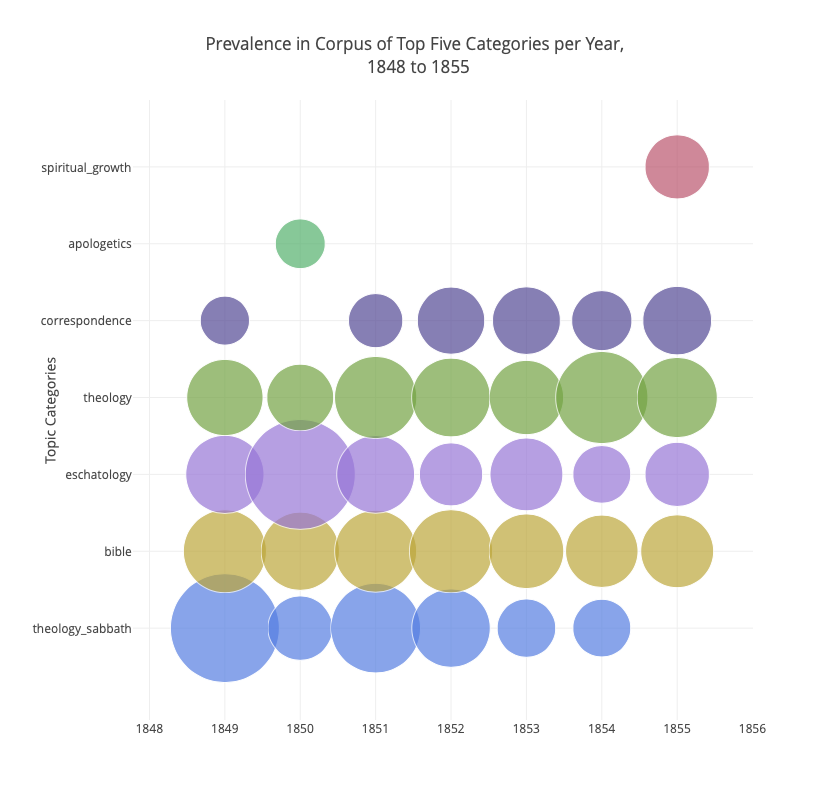

In [22]:
# Test run
top_topics(1848,1855)

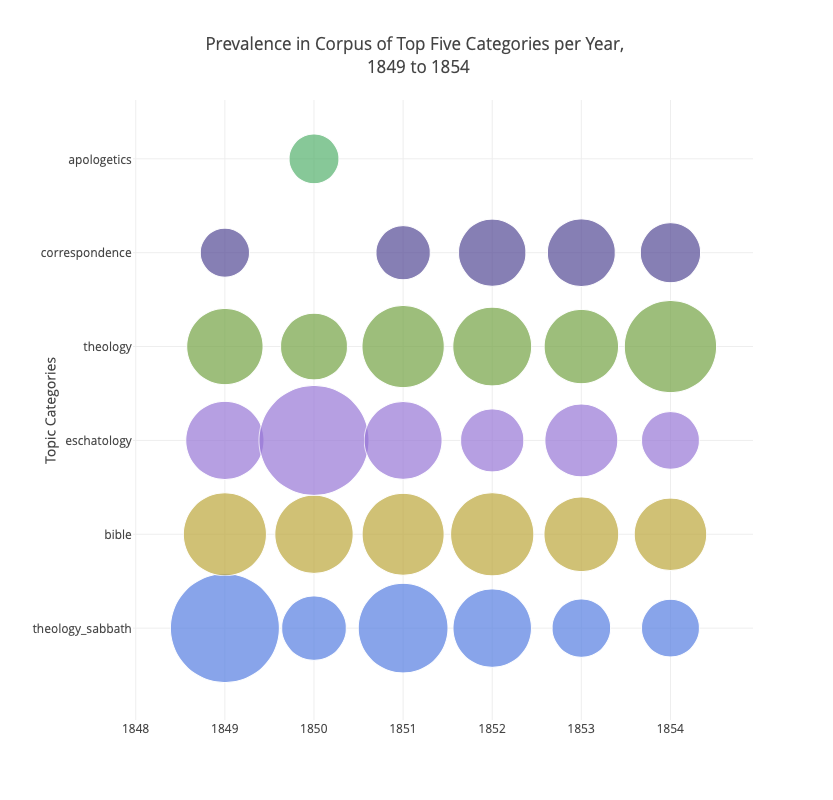

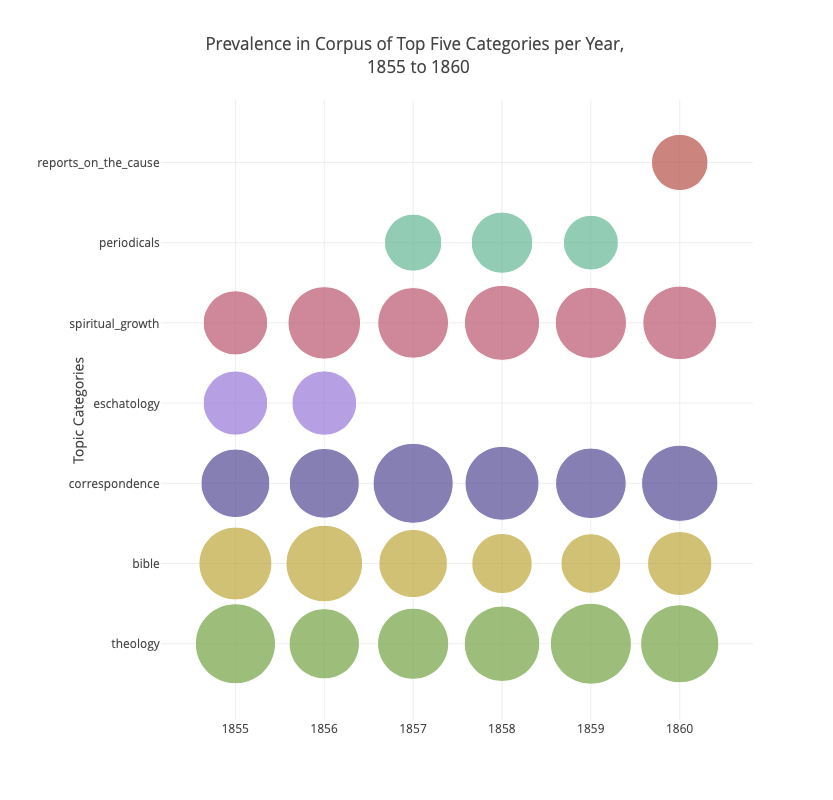

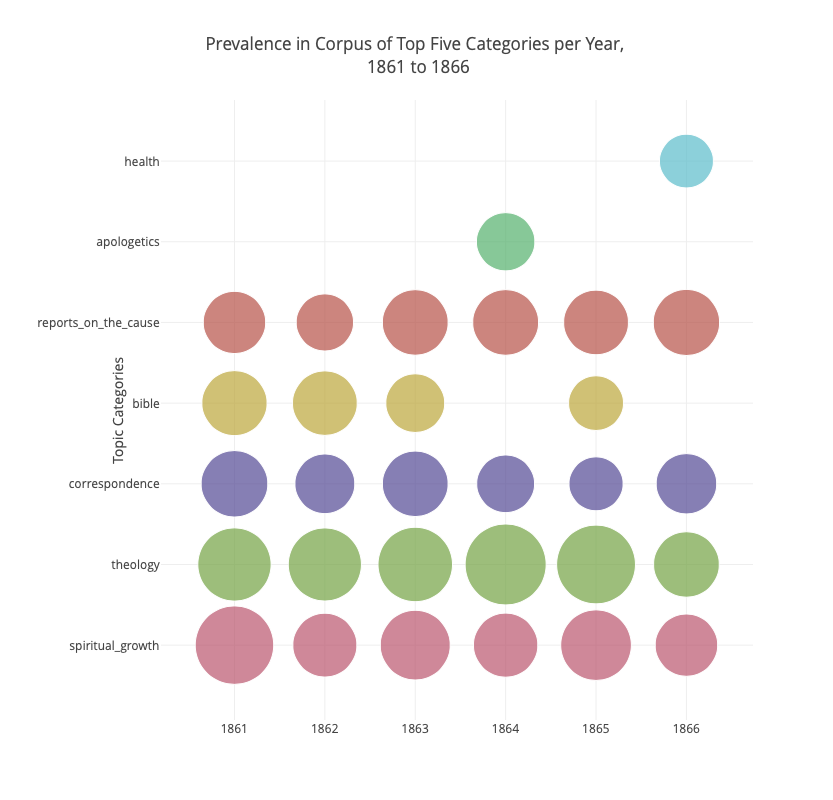

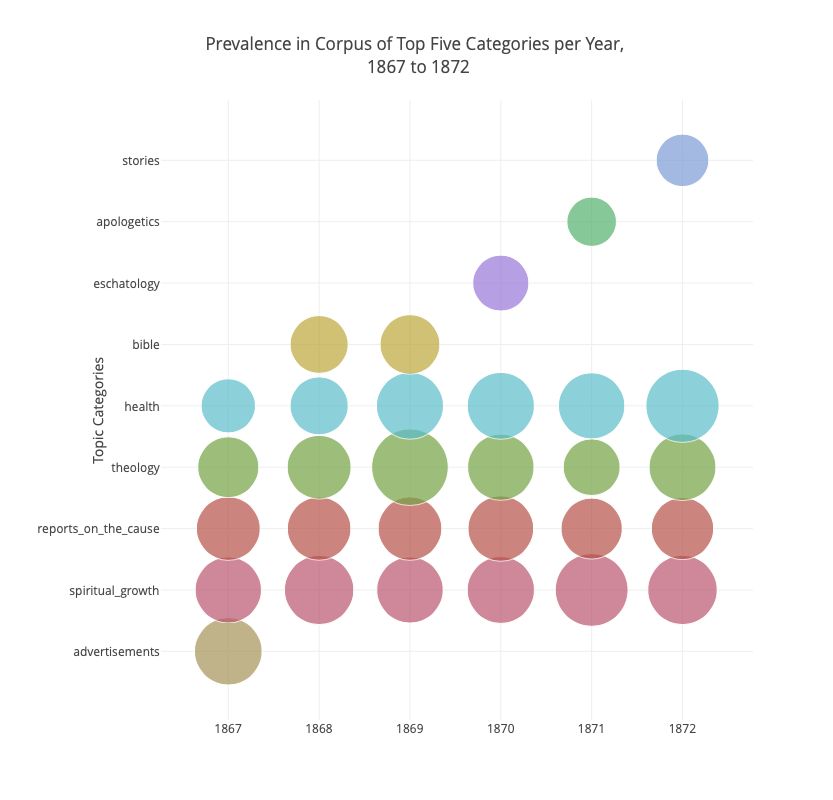

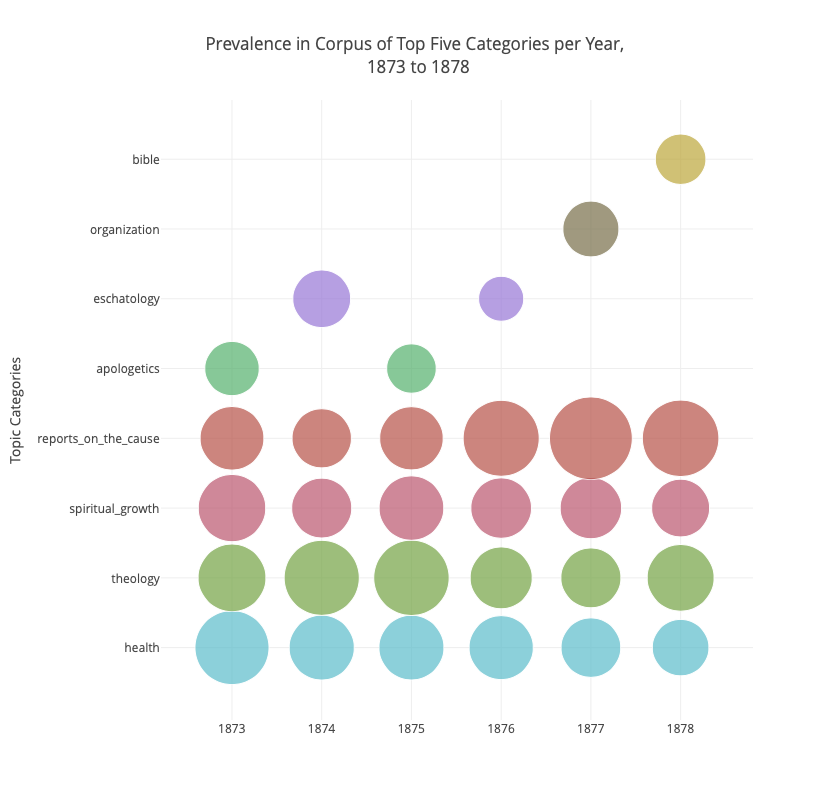

...

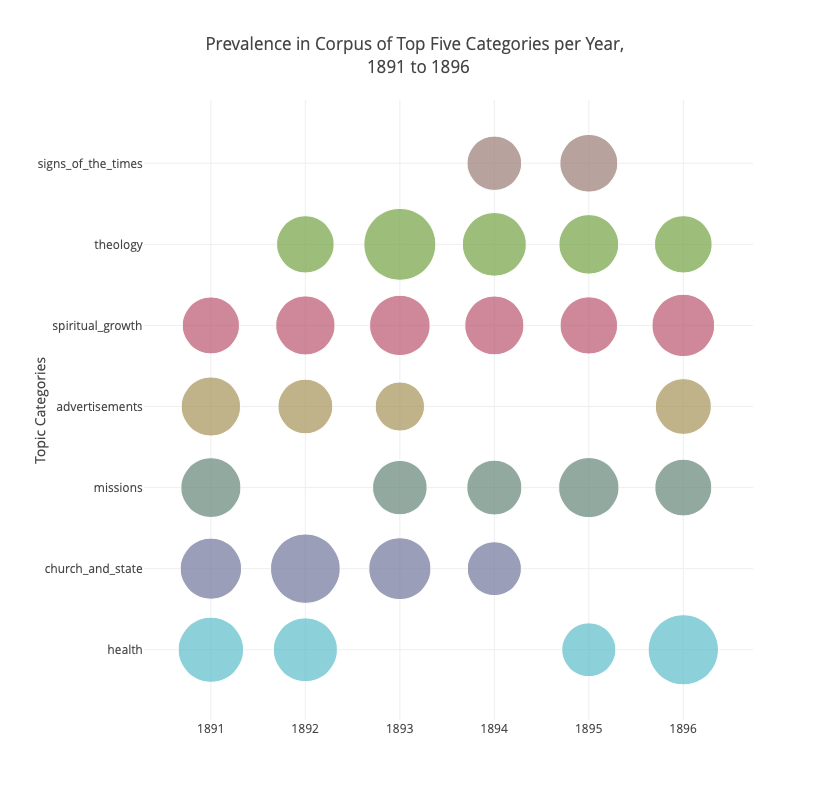

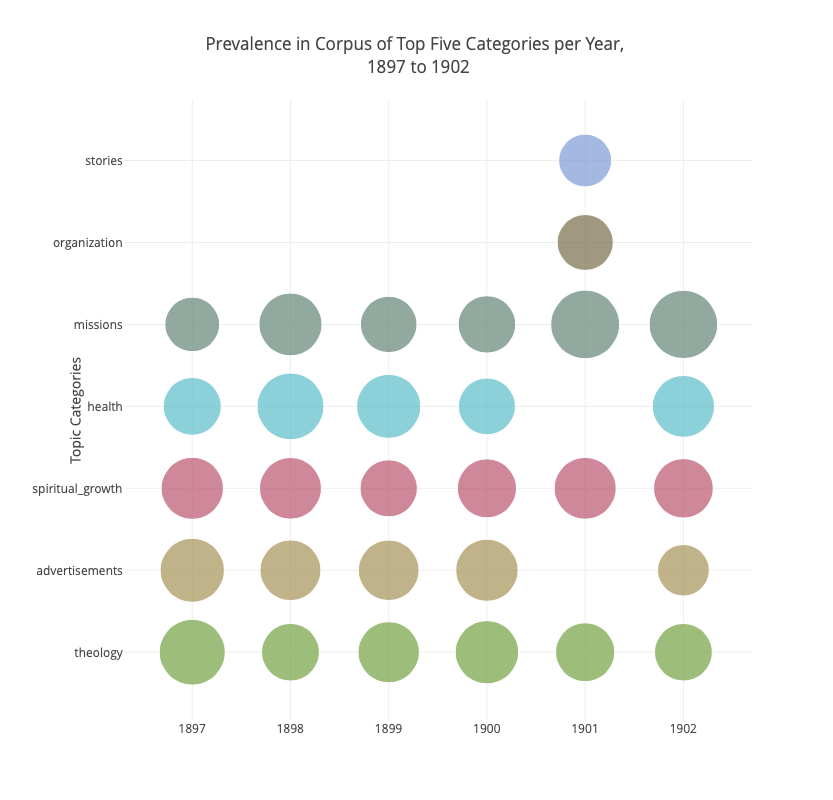

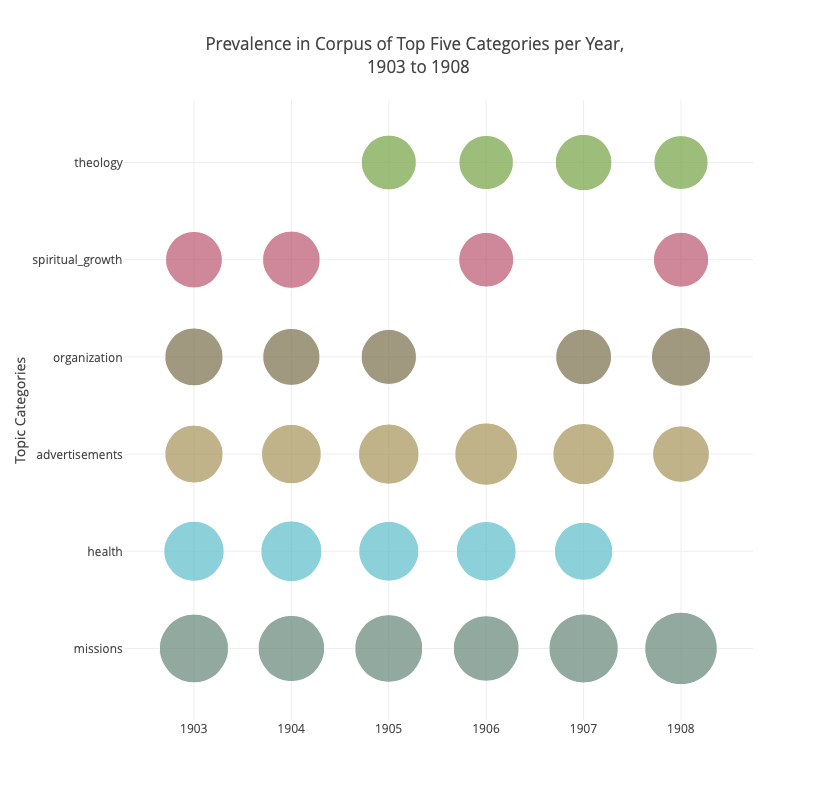

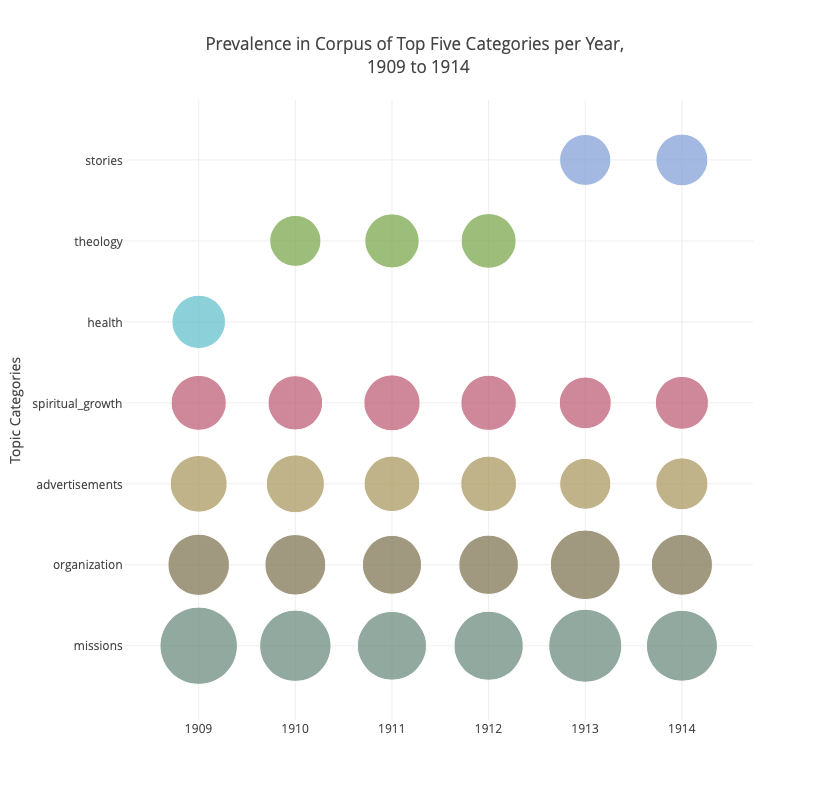

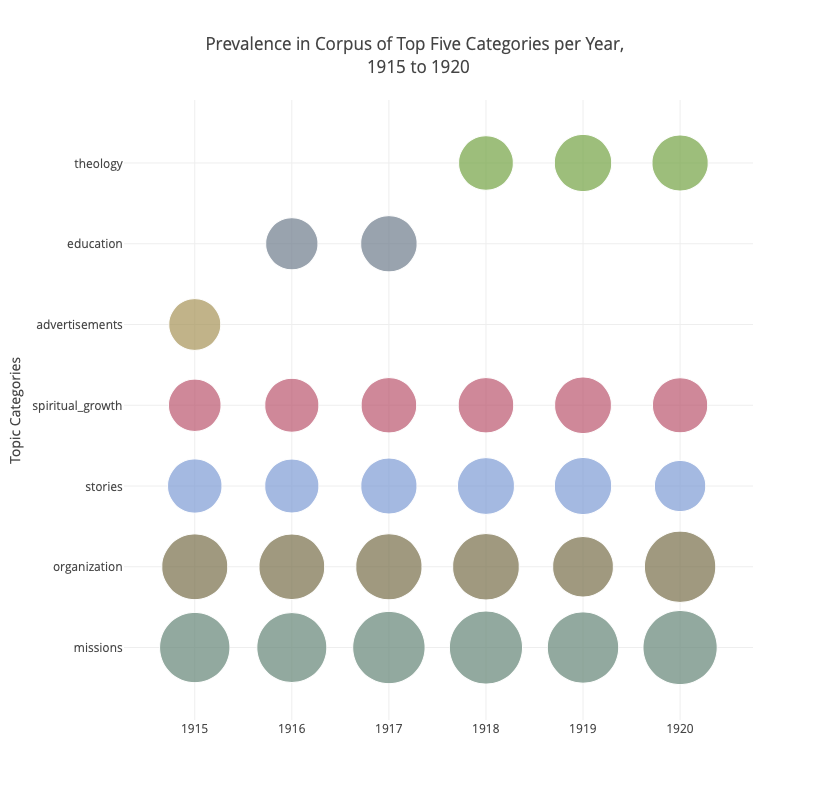

In [23]:
start_years = range(years[0], years[-1], 6)
for each in start_years:
    top_topics(each, each+5, save=True)

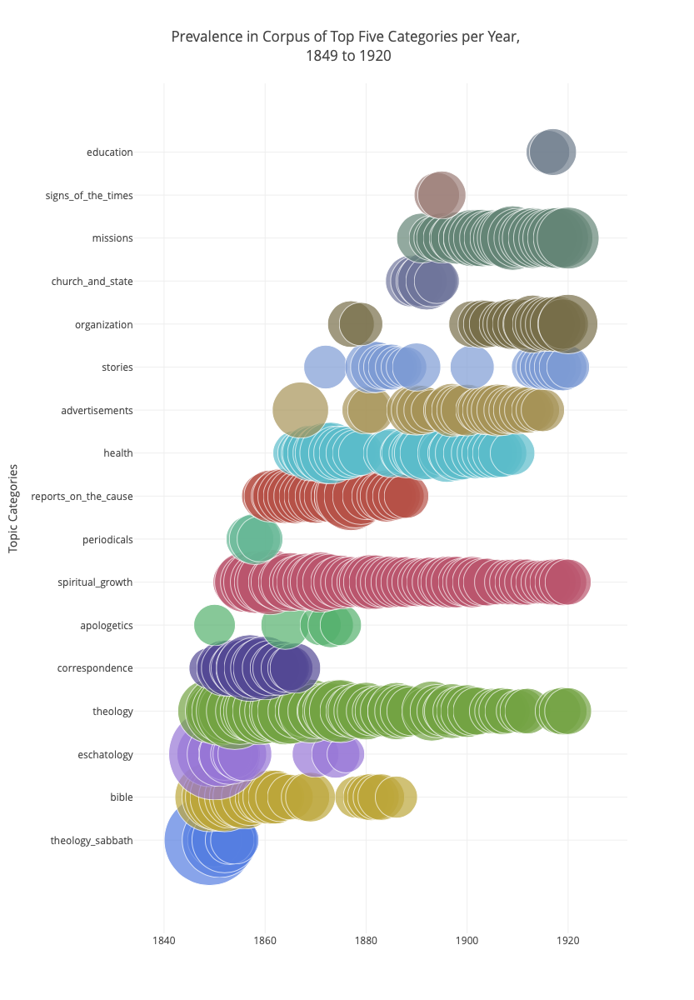

In [25]:
top_topics(start_year=1849, end_year=1920, height=1200, width=1000 , save=True)